### 1. Creating the prerequisites

**Import libraries**

In [1]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import seaborn as sns
from torchvision import datasets as dts
from torchvision.transforms import ToTensor
from torch.utils.data import DataLoader
from torch.autograd import Variable
from tqdm.notebook import tqdm
from termcolor import colored, cprint
from scipy.stats import mannwhitneyu
import scipy.stats as ss
import warnings
from bisect import bisect
warnings.filterwarnings('ignore')
print(torch.__version__)
torch_device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
print(torch_device)
plt.style.use('bmh')

1.13.0
cpu


**MNIST dataset**

In [2]:
traindt = dts.MNIST(
    root = 'data',
    train = True,                         
    transform = ToTensor(), 
    download = True,            
)
testdt = dts.MNIST(
    root = 'data', 
    train = False, 
    transform = ToTensor()
)

train_loader= torch.utils.data.DataLoader(traindt, batch_size=100, shuffle=True, num_workers=1)

In [3]:
# Split data from labels. Something like unzip.

test_img   = torch.cat([data[0] for data in testdt]).view(-1, 28*28).to(torch_device)
test_label = torch.Tensor([data[1] for data in testdt]).to(torch_device)
test_num   = len(testdt)

train_img   = torch.cat([data[0] for data in traindt]).view(-1, 28*28).to(torch_device)
train_label = torch.Tensor([data[1] for data in traindt]).to(torch_device)
train_num   = len(traindt)

class_num = int(torch.max(train_label).data.cpu().numpy()+1)

print("train num:   ", train_num)
print("train shape: ", train_img.shape)
print("test num:    ", test_num)
print("test shape:  ", test_img.shape)
print("class num:   ", class_num)


train num:    60000
train shape:  torch.Size([60000, 784])
test num:     10000
test shape:   torch.Size([10000, 784])
class num:    10


**Statistical functions**

In [4]:
# A procedure to calculate the p-values of a list of scores (query)
# with respect to a given score distribution (distribution) serving as an empirical null distribution

def empirical_p_values(distribution, query, sort=True):
    
    dist_len = len(distribution)
    query_len = len(query)
    
    p_values = np.zeros([query_len,])
    
    for i, score in enumerate(query):
        p_values[i] = (dist_len-bisect(distribution, score))/dist_len
    if sort: return np.sort(p_values)
    return p_values

# Procedure to calculate q-values from true class labels
def calculate_qvalues_from_labels(scores, labels):

    sort_data = torch.sort(scores, descending=True)
    sorted_test_scores = sort_data[0].data.cpu().numpy()
    sorted_test_labels = labels[sort_data[1].data.cpu().numpy()]

    negative = 0
    positive = 0
    fdr = []
    
    for label in sorted_test_labels:
        negative += label == 0
        positive += label == 1
        fdr.append(negative / (negative+positive) )
    
    qvalue = fdr

    for i in range(len(fdr)-1, 0, -1): 
        qvalue[i-1] = min(qvalue[i], qvalue[i-1])
        
    return qvalue

# Procedure to calculate q-values with using p-value, true labels not used.
def calculate_qvalues_from_pvalues(distribution, query, pi_0=0.9):
    p_values = empirical_p_values(np.sort(distribution), query)
    q_values = p_values*len(p_values)*pi_0
    q_values = q_values/np.arange(len(p_values))
    for i in range(len(p_values)-1,0,-1):
        q_values[i-1] = min(q_values[i-1], q_values[i])

    return q_values


def bh_control_of_fdr(label, model, optimizer, criterions, n_epochs, verbosity):
    graphs = []

    target_label = label
    if verbosity > 0: print('Binary classification for label {0}. \n Training phase starts'.format(label))
    model.train()
    
    bin_train_label = (train_label==target_label).data.cpu().numpy().astype(int)
    bin_test_label  = (test_label ==target_label).data.cpu().numpy().astype(int)
    fig, ax = plt.subplots(figsize=(50, 50), ncols=n_epochs, nrows=3)
    
    for epoch in range(n_epochs):
        for (images, labels) in train_loader:
            b_x = Variable(images.view(-1, 28 * 28)).to(torch_device)
            #b_x = Variable(images).to(torch_device)
            b_y = Variable(labels).to(torch_device)
            b_y = (b_y==target_label).float()
            output = model(b_x).squeeze()
            loss = criterions(output, b_y)
            optimizer.zero_grad()           
            loss.backward()              
            optimizer.step()
    

        train_pred_scores  = model(train_img).squeeze().data.cpu().numpy()
        test_pred_scores   = model(test_img).squeeze().data.cpu().numpy()

        train_score_pos = train_pred_scores[bin_train_label == 1]
        train_score_neg = train_pred_scores[bin_train_label == 0] 
        test_score_pos  = test_pred_scores[bin_test_label == 1]
        test_score_neg  = test_pred_scores[bin_test_label == 0]


        sns.histplot(test_score_pos, discrete=True, color='green', alpha=0.4, kde=True,
                     line_kws={'color': 'crimson', 'lw': 5}, label='Negative class', ax=ax[0][epoch])
        sns.histplot(test_score_neg, discrete=True, color='blue', alpha=0.6, kde=True,
             line_kws={'color': 'crimson', 'lw': 5}, label='Positive class', ax=ax[0][epoch])

        ax[0][epoch].set(xlabel='Model prediction scores', title='Test scores')
        ax[0][epoch].legend()

        train_data = [train_score_pos, train_score_neg]
        test_data  = [test_score_pos, test_score_neg]
        class_labels     = ["Positive", "Negative"]

        p_values = empirical_p_values(
            np.sort(train_score_neg),   # reference as an empirical null dist
            test_score_neg   # scores of which the pvalues should be calculated
        )        
        p_value_position = np.arange(len(p_values))/len(p_values)

        ax[1][epoch].plot([0,1],[0,1], color='blue')  # Plot diagonal
        ax[2][epoch].plot([0,1],[0,1], color='blue')  # Plot diagonal

        ax[1][epoch].scatter(p_value_position, p_values, color='red', s=5)
        ax[2][epoch].scatter(p_value_position, p_values, color='red', s=5)

        auc = round(metrics.auc(p_value_position, p_values),2)
        mann_whitney_pval = round(mannwhitneyu(p_value_position, p_values)[1],2)
        ax[0][epoch].set(xlabel='Normalized Rank', ylabel='p-value', \
                     title='%s\n AUC: %g / MWP: %g'%('Negative', auc, mann_whitney_pval))

        ax[2][epoch].set(xlabel='Normalized Rank', ylabel='p-value', xlim=(0,0.02), ylim=(0,0.02),title='')
             
    if verbosity > 0: print('Training phase finished. Evaluation')
    model.eval()

    pred_y         = ((train_pred_scores)>0.0).astype(int)  # prediction for the positive class
    if verbosity > 0:
        print('Train results')
        print(metrics.classification_report(bin_train_label, pred_y))

    pred_y         = ((test_pred_scores)>0.0).astype(int)  # prediction for the positive class
    if verbosity > 0:
        print('Test results')
        print(metrics.classification_report(bin_test_label, pred_y))
    
    if verbosity > 0: print('Plotting scores distribution by class')
    
        
    # calculate Q-values for the test and train data, calculated with true labels
    if verbosity > 0: print('Plotting FDR control with BH')
    data = [train_pred_scores, test_pred_scores]
    labels  = [bin_train_label, bin_test_label]
    class_labels = ["Train", "Test"]
    ylims = [9000,1500]
    
    fig, ax = plt.subplots(figsize=(12, 12), ncols=2, nrows=2)

    for i in range(2):

        # Plot q-values with using labels
        qvalues  = calculate_qvalues_from_labels(torch.Tensor(data[i]), labels[i])
        num_of_positives = sum(labels[i])
        ax[0][i].plot(qvalues, np.arange(len(qvalues)), color='blue', label='using true labels')
        ax[1][i].plot(qvalues, np.arange(len(qvalues)), color='blue', label='using true labels')

        # Plot q-values with using p-values (without labels)
        qvalues = calculate_qvalues_from_pvalues(train_score_neg, data[i], 0.9)
        ax[0][i].plot(qvalues, np.arange(len(qvalues)), color='red', label='using p-values')
        ax[1][i].plot(qvalues, np.arange(len(qvalues)), color='red', label='using p-values')

        ax[0][i].legend()
        ax[1][i].legend()

        ax[0][i].set(xlim=((0,0.1)), ylim=((0,ylims[i])))
        ax[0][i].set(xlabel='', ylabel='Number of accepted tests', title="%s, #pos: %d"%(class_labels[i], num_of_positives))
        ax[1][i].set(xlabel='Estimated FDR (q-value)', ylabel='Number of accepted tests', title="")

    return 


### 2. Processing models

**Simple CNN**

In [5]:
class Flatten(nn.Module):
    def forward(self, x):
        return x.view(x.size()[0], -1)


class CNN_MNIST(nn.Module):
    def __init__(self, out_ch=1):
        super().__init__()
        self.layers = nn.Sequential(
            nn.Conv2d(1, 8, 3, padding=1, stride=2),
            nn.ReLU(),
            nn.Conv2d(8, 8, 3, stride=2, padding=1),
            nn.ReLU(),
            Flatten(),
            nn.Linear(8 * 7 * 7, out_ch)
        )
        
    def forward(self, x):
        return self.layers(x.reshape(-1, 28, 28).unsqueeze(1))

  0%|          | 0/10 [00:00<?, ?it/s]

Binary classification for label 0. 
 Training phase starts
Training phase finished. Evaluation
Train results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54077
           1       0.97      0.99      0.98      5923

    accuracy                           1.00     60000
   macro avg       0.98      0.99      0.99     60000
weighted avg       1.00      1.00      1.00     60000

Test results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9020
           1       0.96      0.99      0.97       980

    accuracy                           0.99     10000
   macro avg       0.98      0.99      0.99     10000
weighted avg       1.00      0.99      1.00     10000

Plotting scores distribution by class
Plotting FDR control with BH


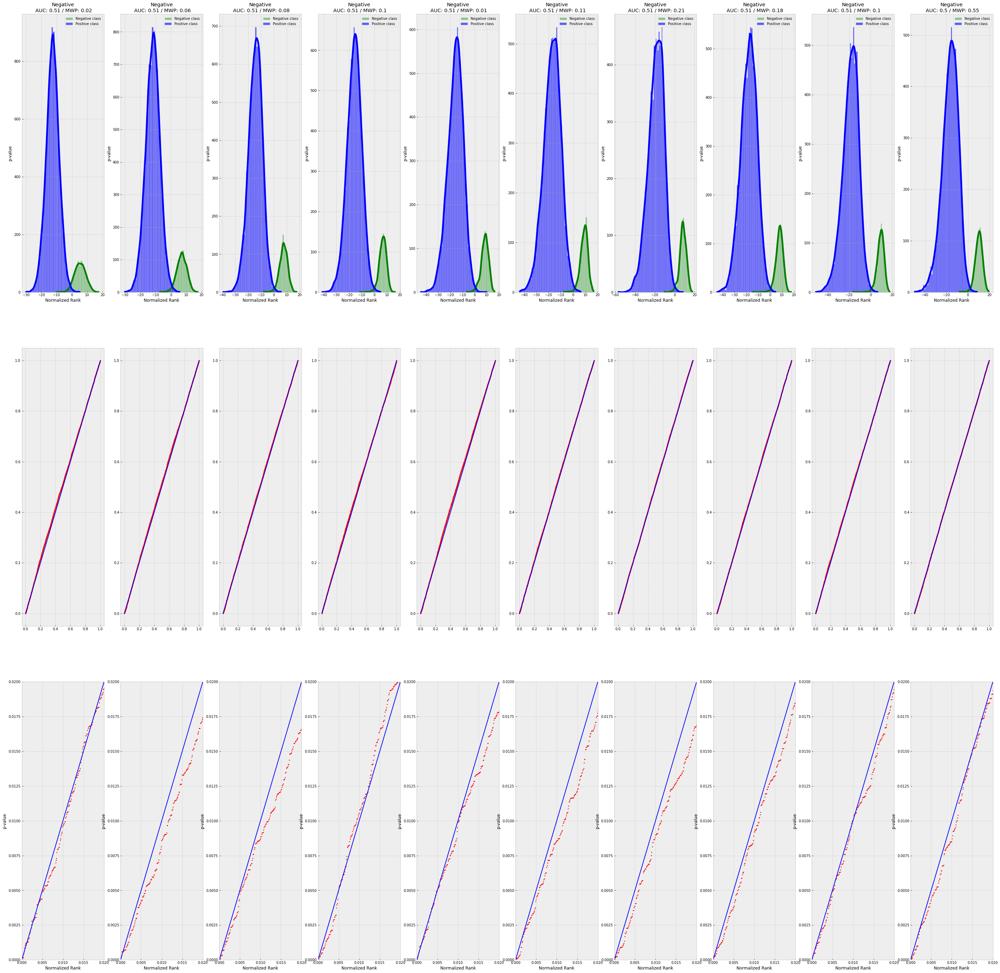

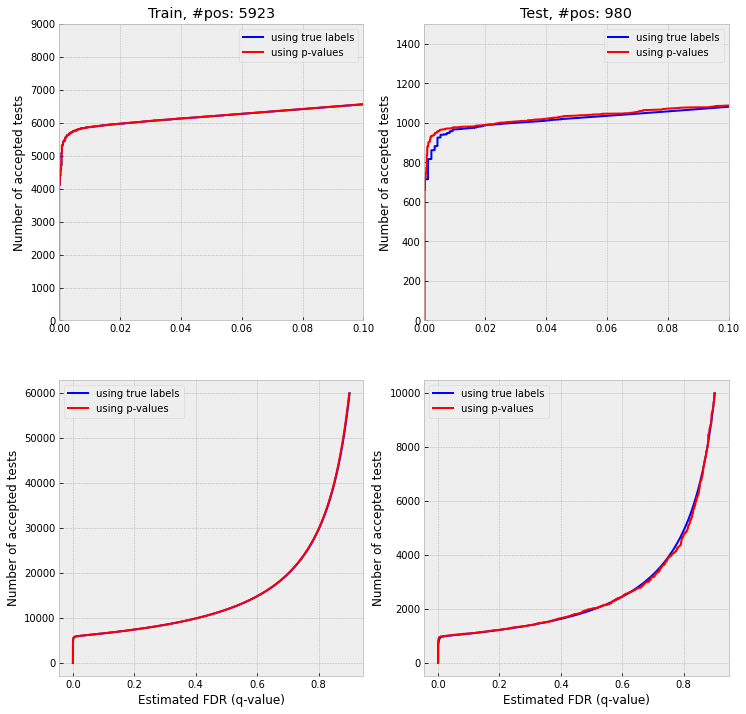

Binary classification for label 1. 
 Training phase starts
Training phase finished. Evaluation
Train results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53258
           1       0.99      0.99      0.99      6742

    accuracy                           1.00     60000
   macro avg       0.99      0.99      0.99     60000
weighted avg       1.00      1.00      1.00     60000

Test results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8865
           1       0.98      0.99      0.99      1135

    accuracy                           1.00     10000
   macro avg       0.99      0.99      0.99     10000
weighted avg       1.00      1.00      1.00     10000

Plotting scores distribution by class
Plotting FDR control with BH


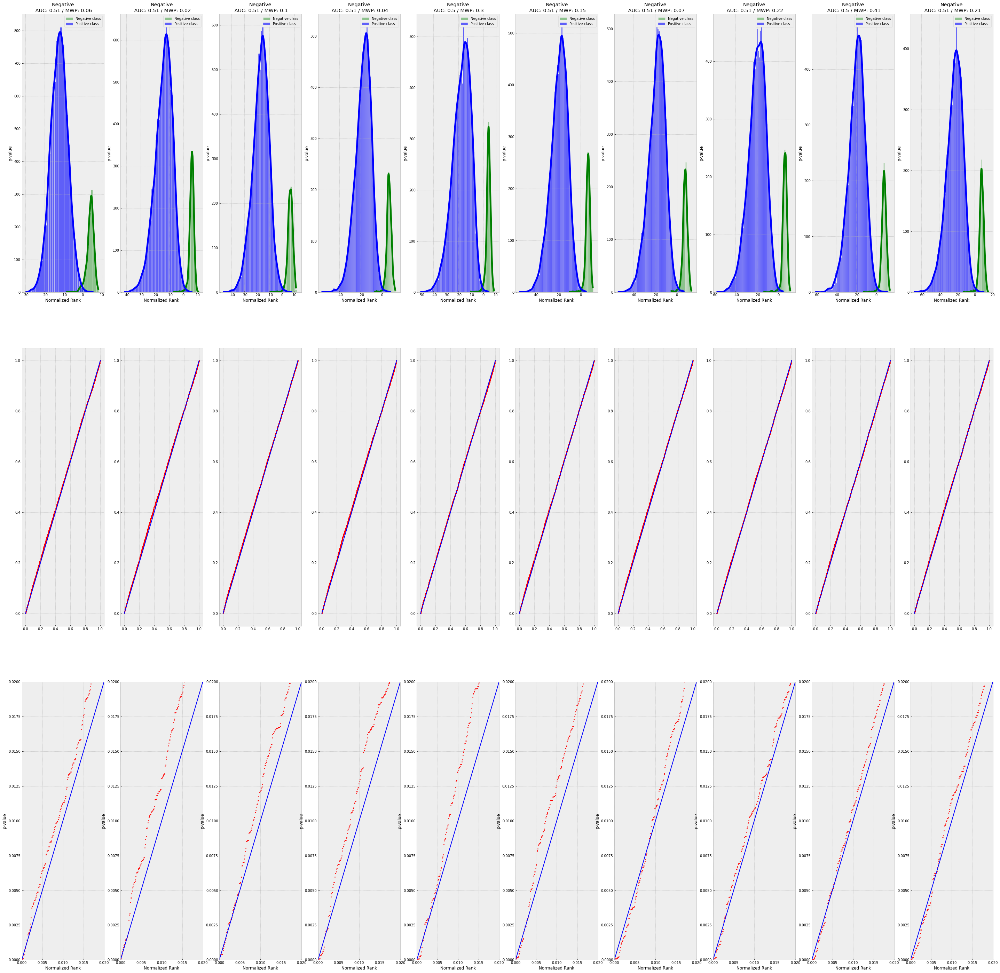

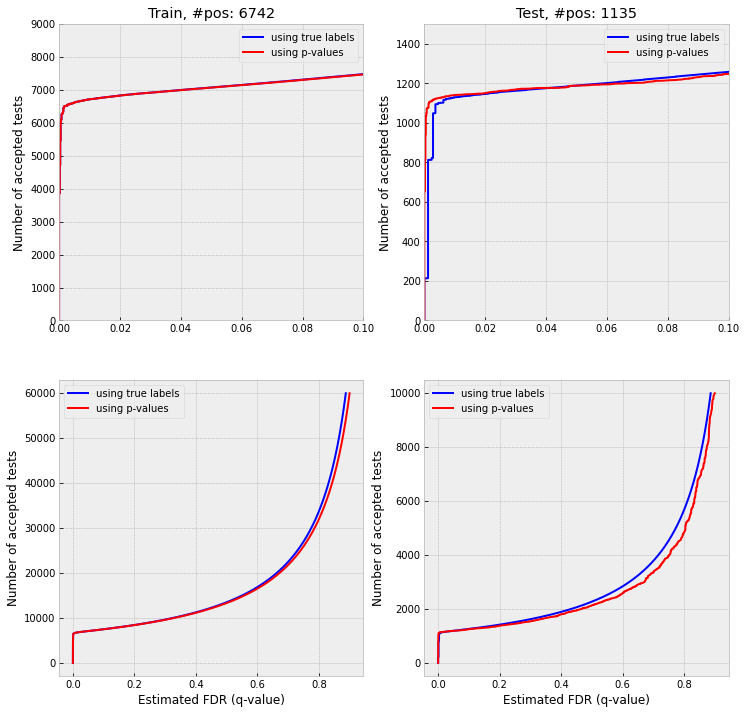

Binary classification for label 2. 
 Training phase starts
Training phase finished. Evaluation
Train results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54042
           1       0.96      0.98      0.97      5958

    accuracy                           0.99     60000
   macro avg       0.98      0.99      0.98     60000
weighted avg       0.99      0.99      0.99     60000

Test results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8968
           1       0.96      0.97      0.96      1032

    accuracy                           0.99     10000
   macro avg       0.98      0.98      0.98     10000
weighted avg       0.99      0.99      0.99     10000

Plotting scores distribution by class
Plotting FDR control with BH


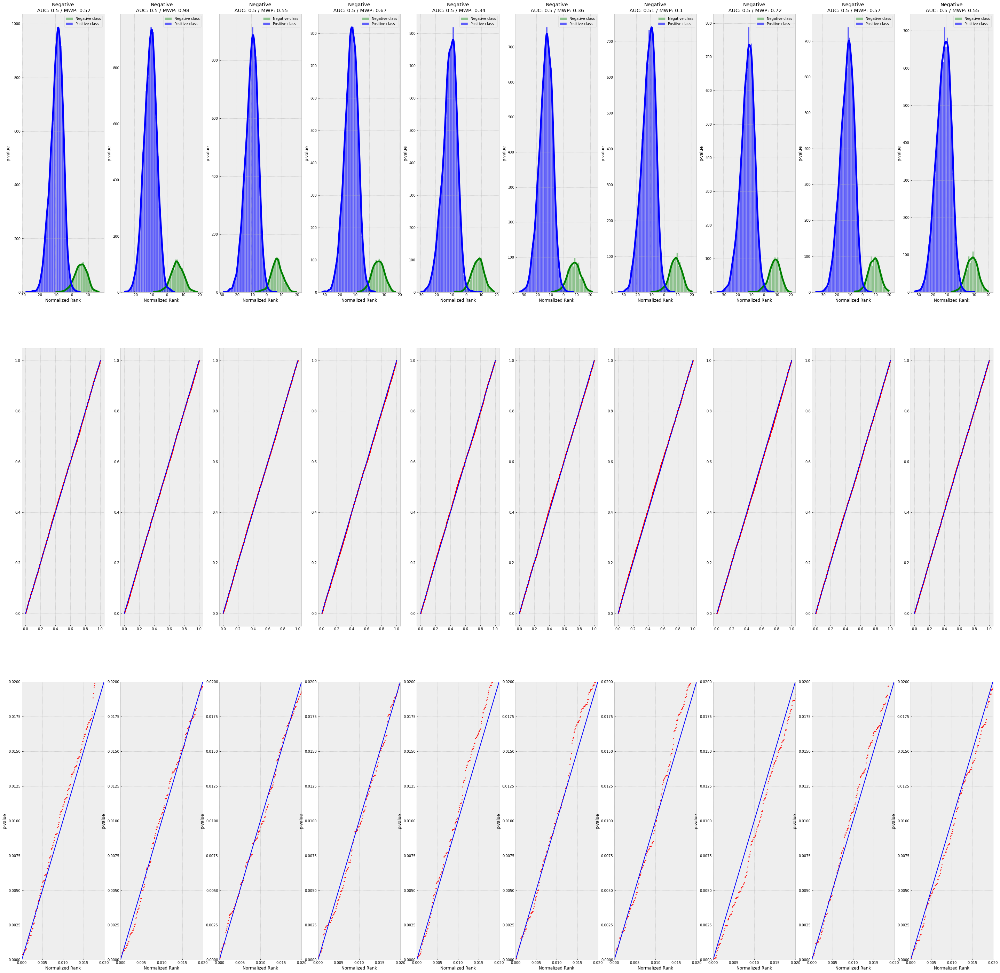

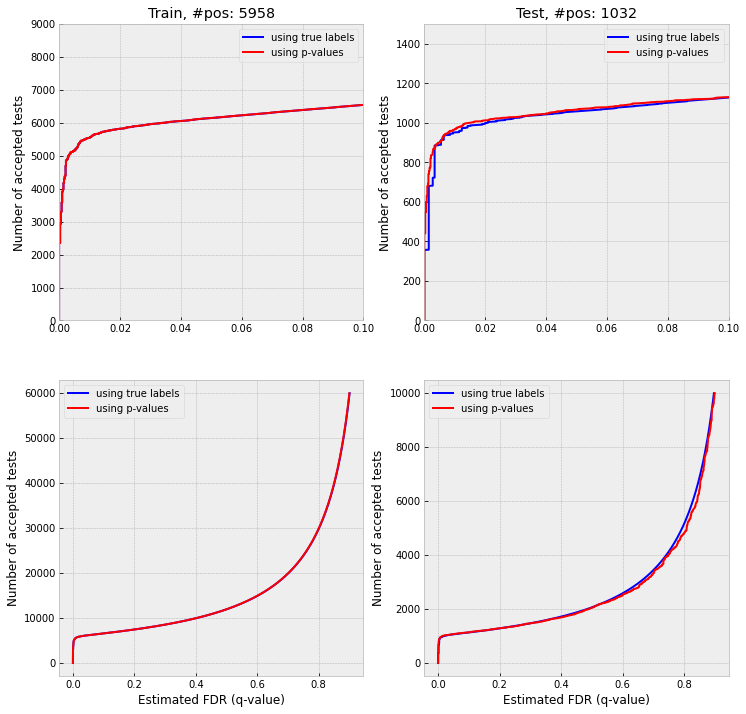

Binary classification for label 3. 
 Training phase starts
Training phase finished. Evaluation
Train results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53869
           1       0.97      0.97      0.97      6131

    accuracy                           0.99     60000
   macro avg       0.98      0.99      0.98     60000
weighted avg       0.99      0.99      0.99     60000

Test results
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      8990
           1       0.95      0.98      0.96      1010

    accuracy                           0.99     10000
   macro avg       0.97      0.99      0.98     10000
weighted avg       0.99      0.99      0.99     10000

Plotting scores distribution by class
Plotting FDR control with BH


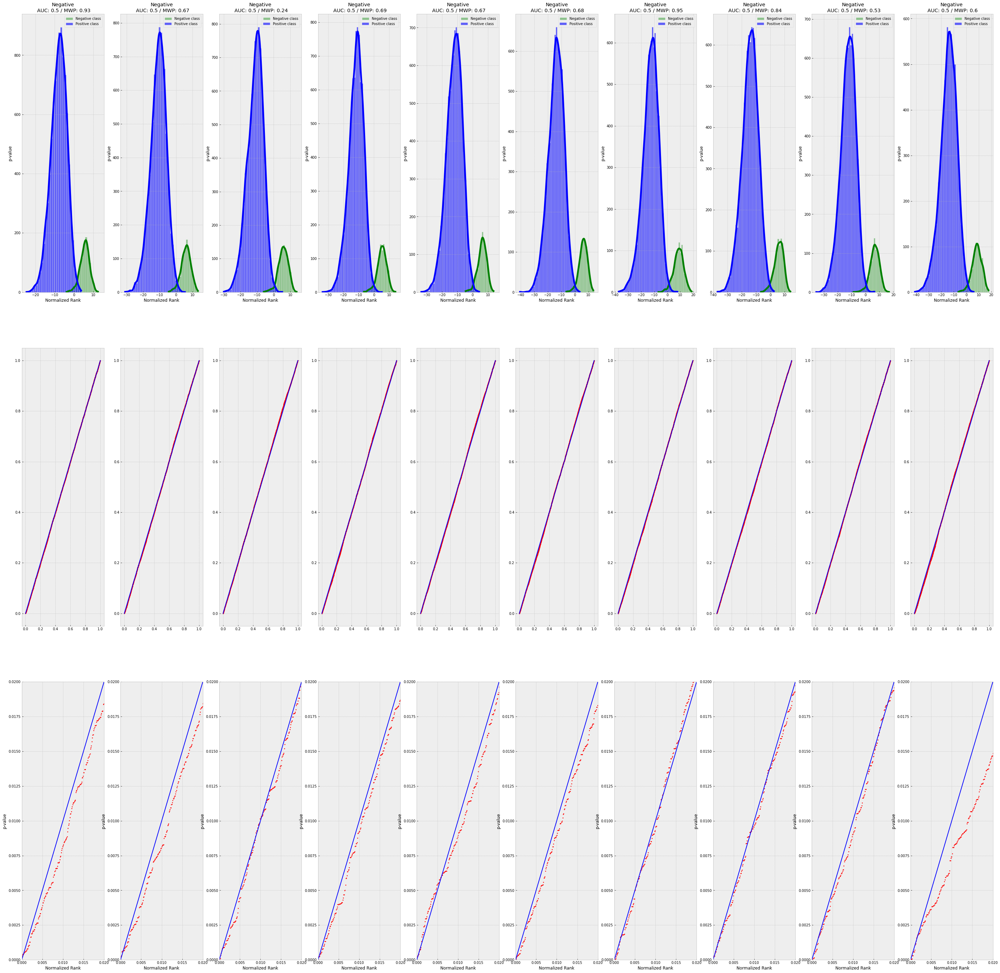

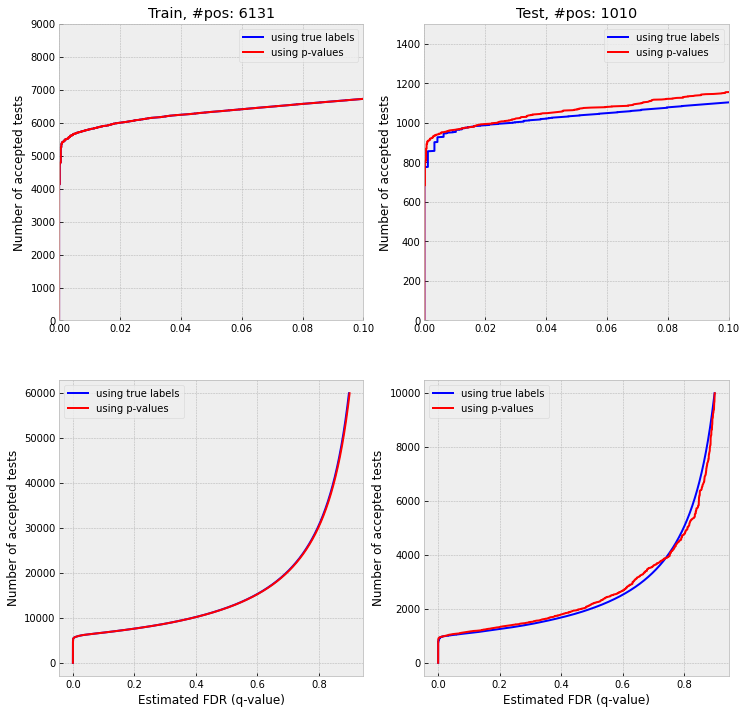

Binary classification for label 4. 
 Training phase starts
Training phase finished. Evaluation
Train results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54158
           1       0.98      0.98      0.98      5842

    accuracy                           1.00     60000
   macro avg       0.99      0.99      0.99     60000
weighted avg       1.00      1.00      1.00     60000

Test results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9018
           1       0.97      0.96      0.97       982

    accuracy                           0.99     10000
   macro avg       0.98      0.98      0.98     10000
weighted avg       0.99      0.99      0.99     10000

Plotting scores distribution by class
Plotting FDR control with BH


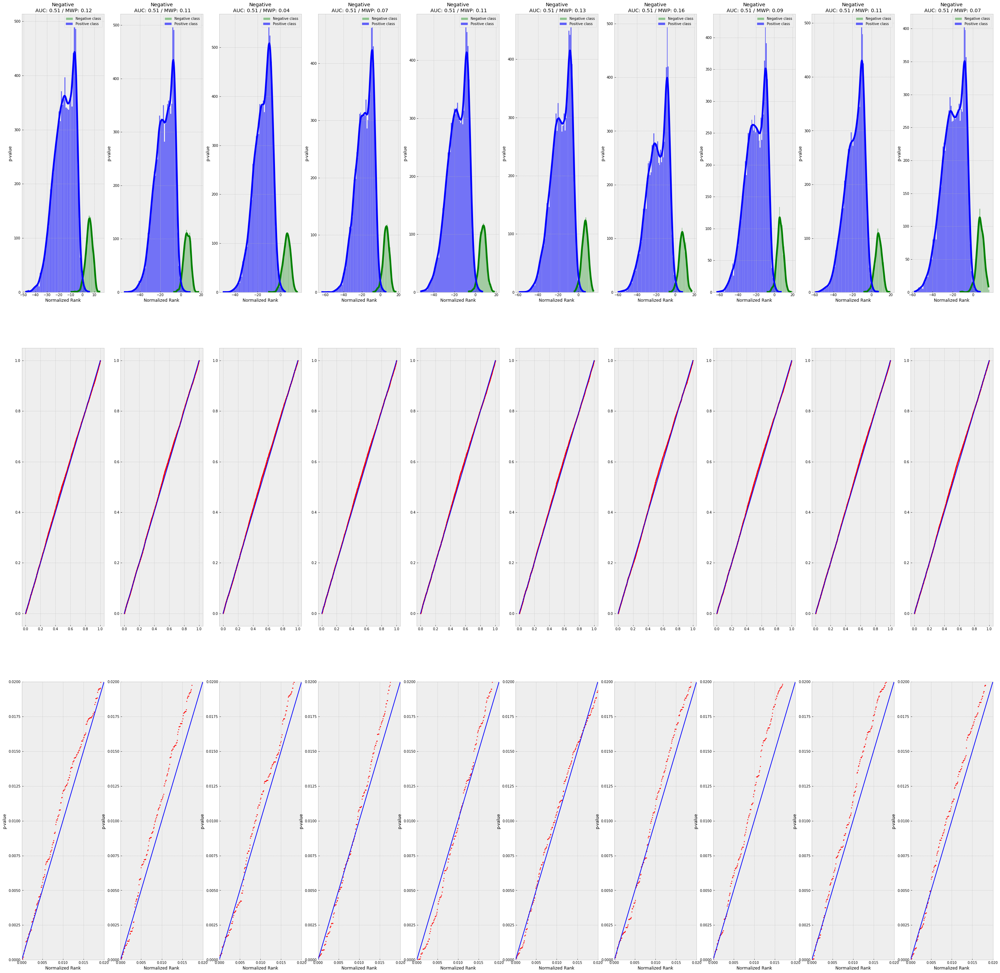

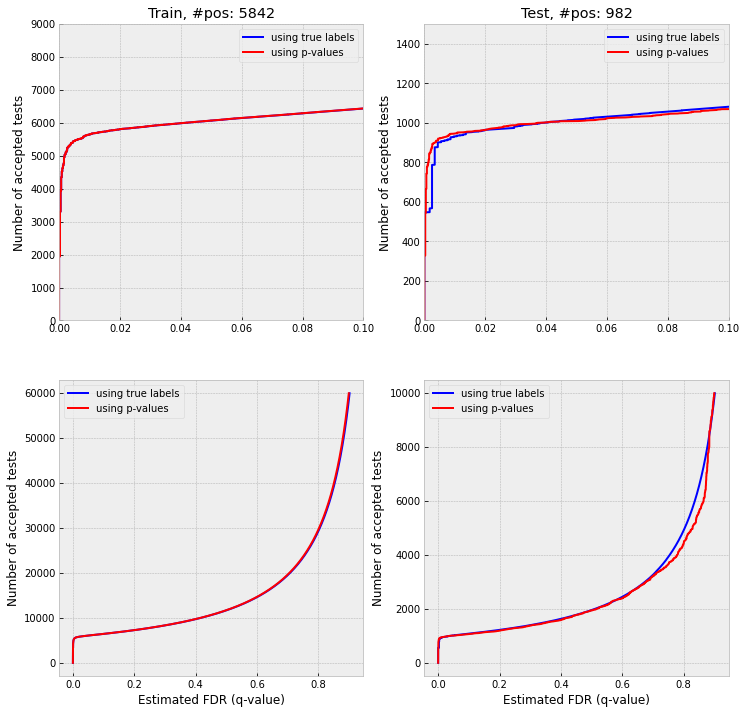

Binary classification for label 5. 
 Training phase starts
Training phase finished. Evaluation
Train results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54579
           1       0.98      0.95      0.97      5421

    accuracy                           0.99     60000
   macro avg       0.99      0.98      0.98     60000
weighted avg       0.99      0.99      0.99     60000

Test results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9108
           1       0.99      0.96      0.97       892

    accuracy                           0.99     10000
   macro avg       0.99      0.98      0.98     10000
weighted avg       0.99      0.99      0.99     10000

Plotting scores distribution by class
Plotting FDR control with BH


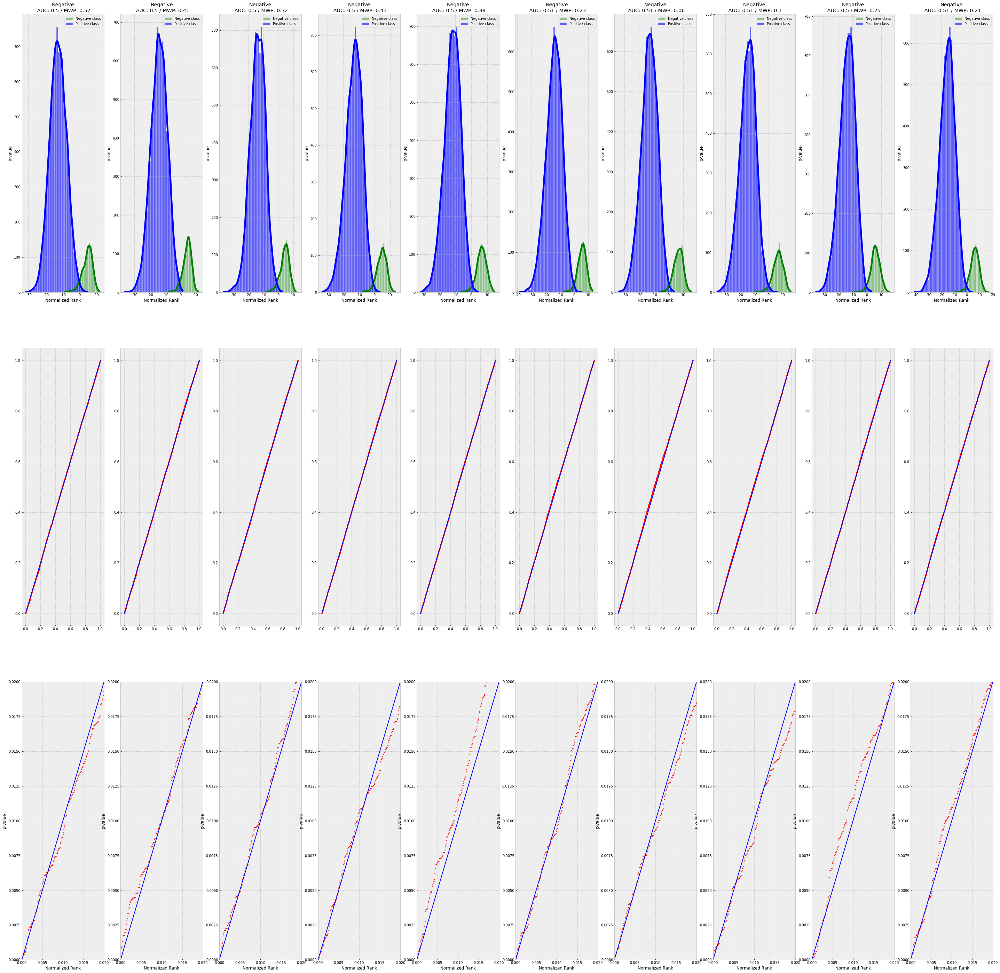

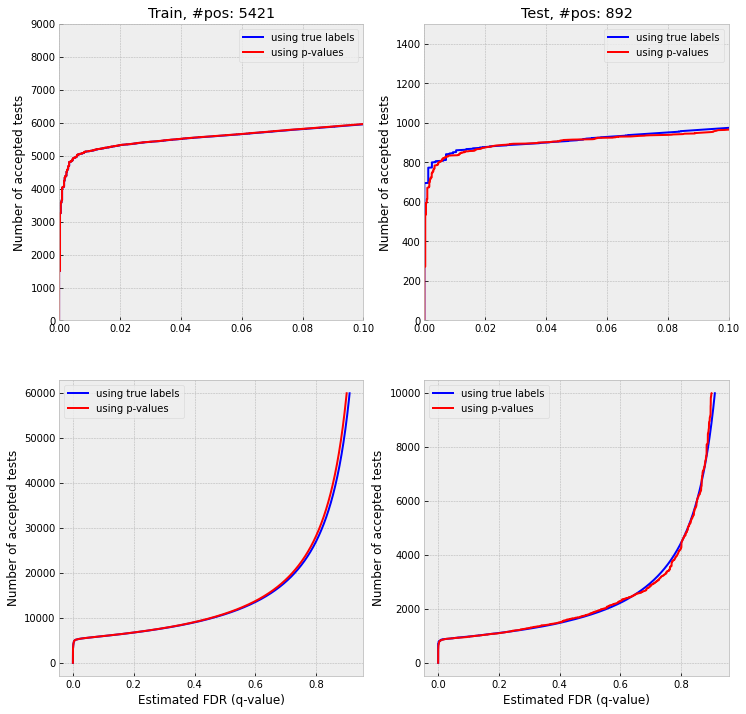

Binary classification for label 6. 
 Training phase starts
Training phase finished. Evaluation
Train results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     54082
           1       0.99      0.99      0.99      5918

    accuracy                           1.00     60000
   macro avg       1.00      0.99      0.99     60000
weighted avg       1.00      1.00      1.00     60000

Test results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9042
           1       0.99      0.97      0.98       958

    accuracy                           1.00     10000
   macro avg       0.99      0.99      0.99     10000
weighted avg       1.00      1.00      1.00     10000

Plotting scores distribution by class
Plotting FDR control with BH


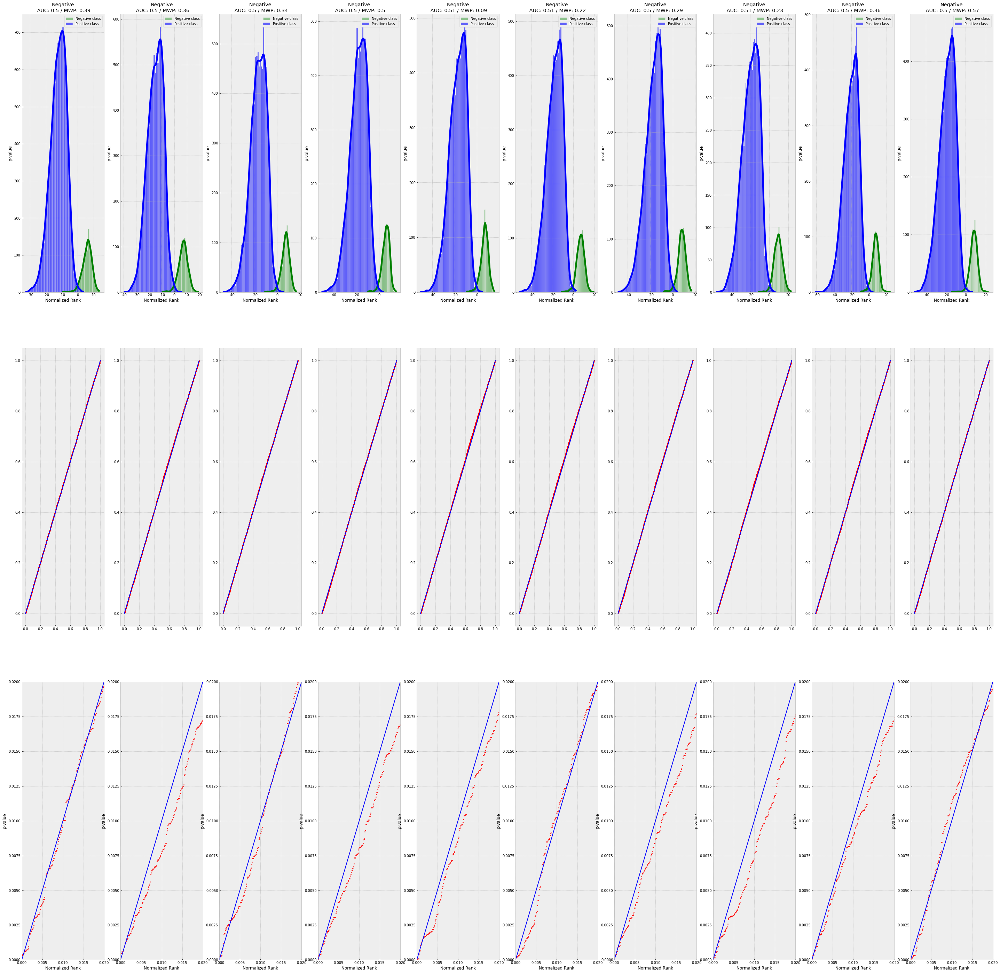

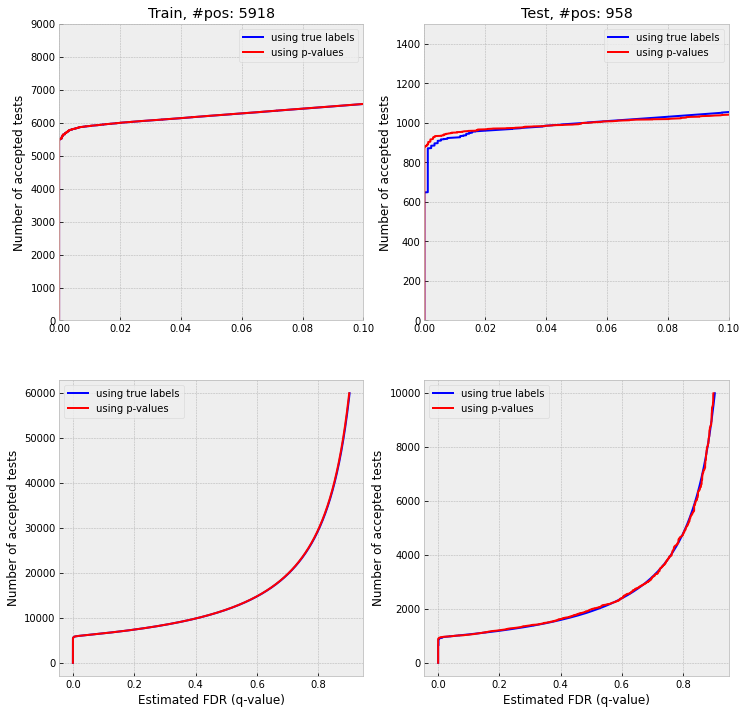

Binary classification for label 7. 
 Training phase starts
Training phase finished. Evaluation
Train results
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     53735
           1       0.98      0.96      0.97      6265

    accuracy                           0.99     60000
   macro avg       0.99      0.98      0.98     60000
weighted avg       0.99      0.99      0.99     60000

Test results
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      8972
           1       0.98      0.95      0.96      1028

    accuracy                           0.99     10000
   macro avg       0.98      0.97      0.98     10000
weighted avg       0.99      0.99      0.99     10000

Plotting scores distribution by class
Plotting FDR control with BH


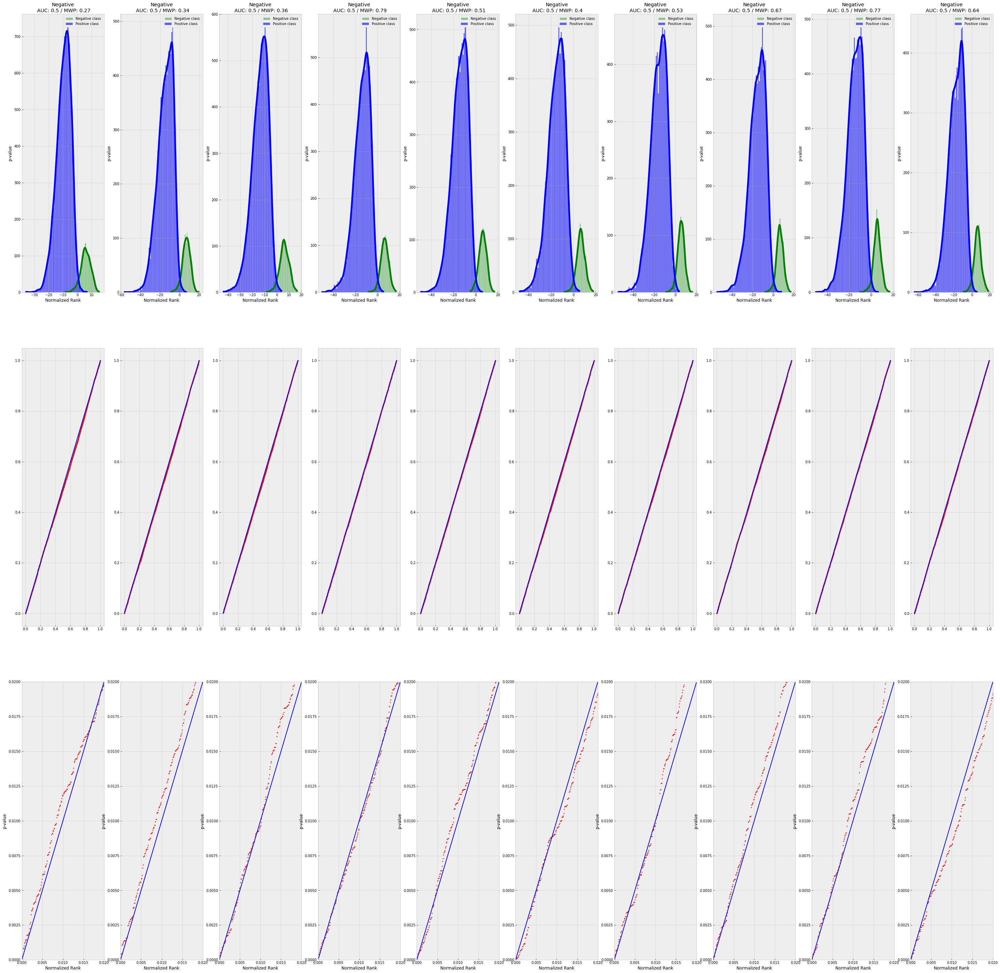

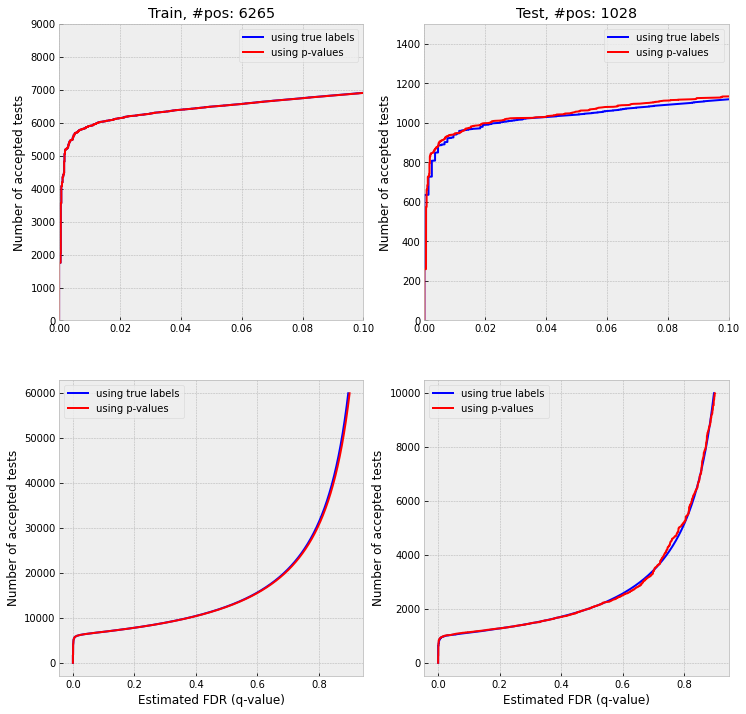

Binary classification for label 8. 
 Training phase starts
Training phase finished. Evaluation
Train results
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     54149
           1       0.97      0.95      0.96      5851

    accuracy                           0.99     60000
   macro avg       0.98      0.97      0.98     60000
weighted avg       0.99      0.99      0.99     60000

Test results
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      9026
           1       0.97      0.95      0.96       974

    accuracy                           0.99     10000
   macro avg       0.98      0.97      0.98     10000
weighted avg       0.99      0.99      0.99     10000

Plotting scores distribution by class
Plotting FDR control with BH


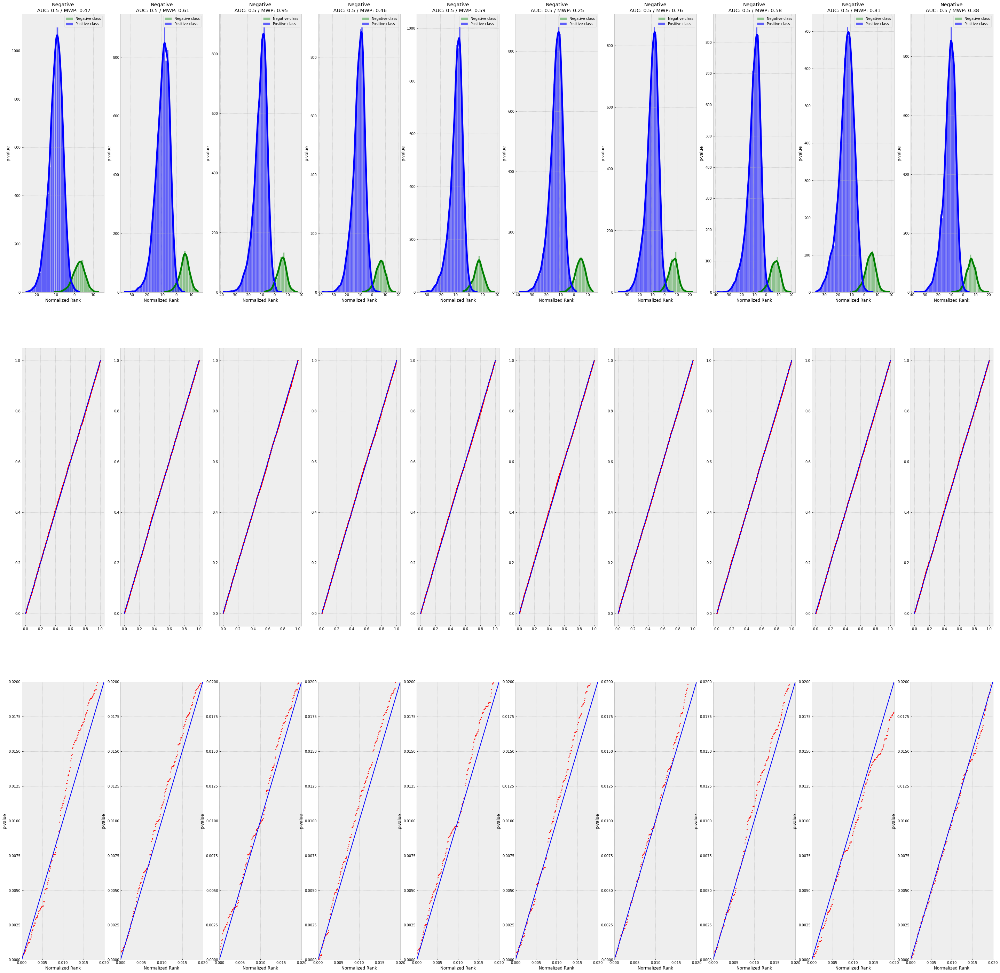

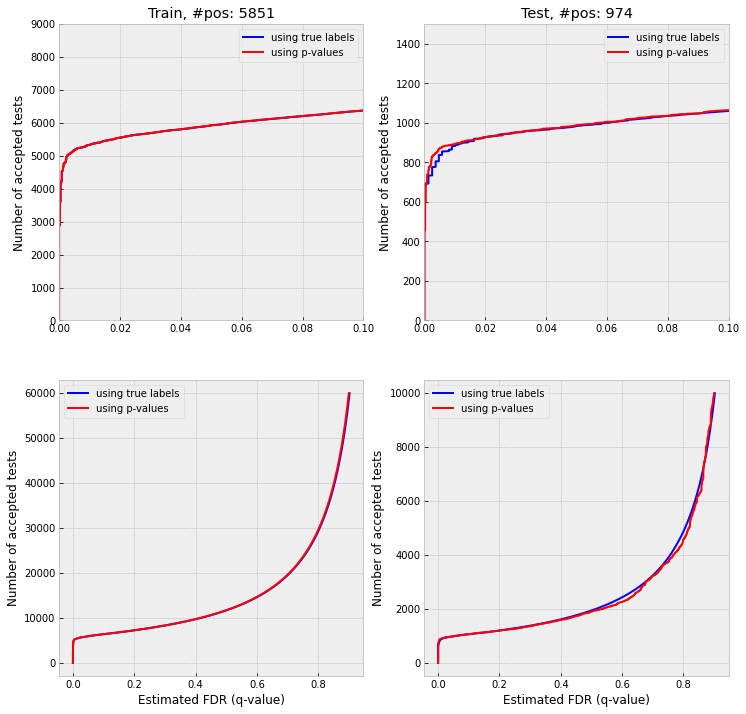

Binary classification for label 9. 
 Training phase starts
Training phase finished. Evaluation
Train results
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     54051
           1       0.94      0.96      0.95      5949

    accuracy                           0.99     60000
   macro avg       0.97      0.98      0.97     60000
weighted avg       0.99      0.99      0.99     60000

Test results
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      8991
           1       0.94      0.94      0.94      1009

    accuracy                           0.99     10000
   macro avg       0.96      0.97      0.97     10000
weighted avg       0.99      0.99      0.99     10000

Plotting scores distribution by class
Plotting FDR control with BH


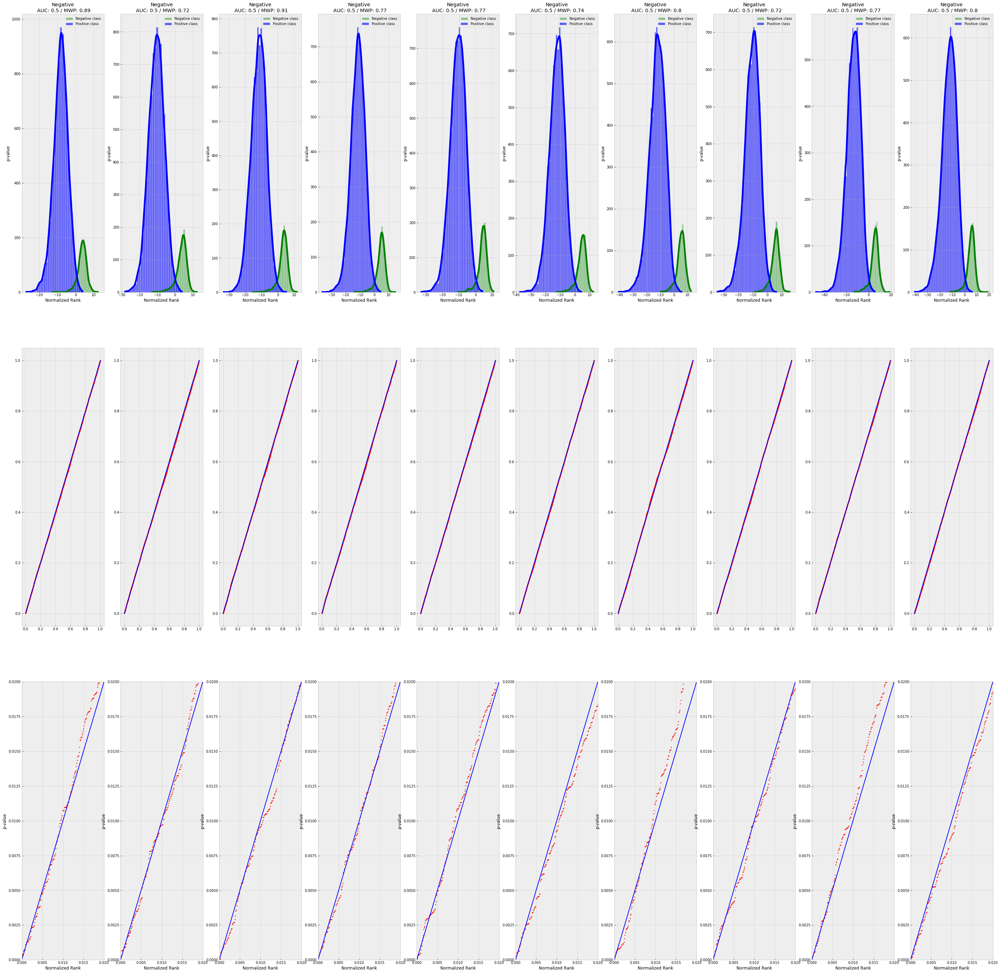

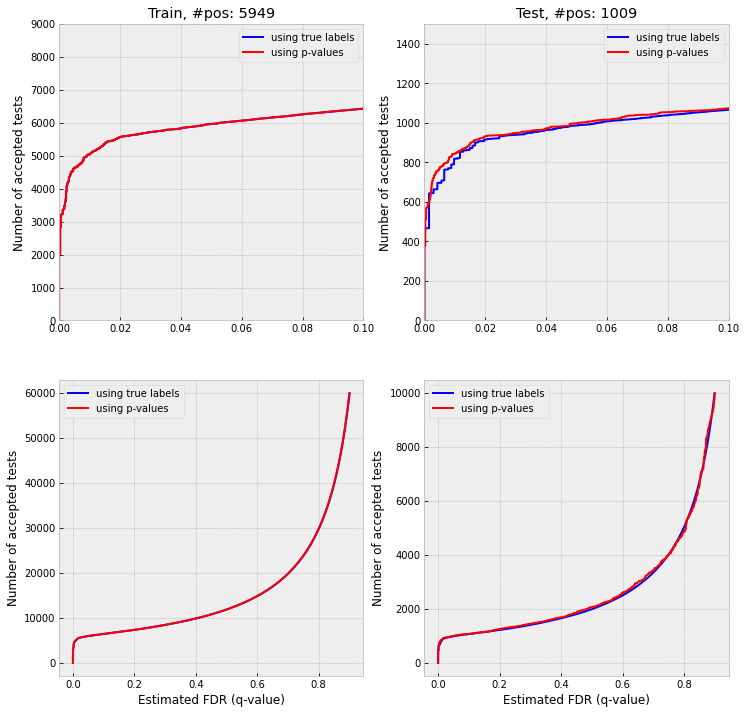

In [6]:
n_epochs = 10
n_classes = 10
type_of_model = CNN_MNIST
for label in tqdm(range(n_classes)):
    model = type_of_model().to(torch_device)
    optimizer = torch.optim.Adam(model.parameters(), lr = 0.01)
    criterions = torch.nn.BCEWithLogitsLoss().to(torch_device)
    bh_control_of_fdr(label, model, optimizer, criterions, n_epochs, 1)
    plt.show()

### 3. Multilabel BH

In [6]:
class LogisticRegression(torch.nn.Module):
    def __init__(self):
        super(LogisticRegression, self).__init__()
        self.linear = torch.nn.Linear(784, 10)
        
    def forward(self, x):
        y_pred = self.linear(x)
        return y_pred

In [8]:
def multilabel_train(model, optimizer, criterions, verbosity=0):
    if verbosity > 0: print('Multilabel classification. \n Training phase starts')
    model.train()
    for epoch in tqdm(range(n_epochs)):
        for (images, labels) in train_loader:
            b_x = Variable(images.view(-1, 28 * 28)).to(torch_device)
            b_y = Variable(labels).to(torch_device)
            output = model(b_x)
            loss = criterions(output, b_y)
            optimizer.zero_grad()           
            loss.backward()  
            optimizer.step()
        train_pred_scores = model(train_img).squeeze()
        print('Epoch', epoch)
        print('Train', 1-torch.mean((torch.argmax(train_pred_scores, dim=-1) == train_label).float()))
        test_pred_scores = model(test_img).squeeze()
        print('Test', 1-torch.mean((torch.argmax(test_pred_scores, dim=-1) == test_label).float()))
    return model

def roc_calc(label_binarizer, labels, pred_argmax):
    test_onehot = label_binarizer.transform(labels)
    
    fpr, tpr = dict(), dict()
    for i in range(10):
        fpr[i], tpr[i], _ = roc_curve(test_onehot[:, i], (pred_argmax == i).int())

    fpr_grid = np.linspace(0.0, 1.0, 1000)
    mean_tpr = np.zeros_like(fpr_grid)

    for i in range(10):
        mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])

    mean_tpr /= 10
    return fpr_grid, mean_tpr

In [9]:
n_epochs = 3
type_of_model = CNN_MNIST
model = type_of_model(10).to(torch_device)
optimizer = torch.optim.Adam(model.parameters(), lr = 0.01)
criterions = torch.nn.CrossEntropyLoss().to(torch_device)
model = multilabel_train(model, optimizer, criterions, 1)

Multilabel classification. 
 Training phase starts


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 0
Train tensor(0.0328)
Test tensor(0.0290)
Epoch 1
Train tensor(0.0283)
Test tensor(0.0273)
Epoch 2
Train tensor(0.0251)
Test tensor(0.0226)


In [10]:
def calculate_fdr(scores, labels):
    sort_data = torch.sort(scores, descending=True)
    sorted_test_scores = sort_data[0].data.cpu().numpy()
    sorted_test_labels = labels[sort_data[1].data.cpu().numpy()]

    negative = 0
    positive = 0
    fdr = []
    
    for label in sorted_test_labels:
        negative += label.item() == 0
        positive += label.item() == 1
        fdr.append(negative / (negative+positive) )
    return np.array(fdr)

from scipy.stats import binom

def hb_p_value(r_hat, n, alpha=0.1):
    bentkus_p_value = np.e * binom.cdf(np.ceil(n * r_hat), n, alpha)
    def h1(y,mu):
        with np.errstate(divide='ignore'): return y * np.log(y/mu) + (1-y) * np.log((1-y)/(1-mu))
        
    hoeffding_p_value = np.exp(-n * h1(min(r_hat, alpha), alpha))
    return min(bentkus_p_value, hoeffding_p_value)

from statsmodels.stats.multitest import multipletests

def bonferroni(p_values,delta):
    rejections, _, _, _ = multipletests(p_values,delta,method='holm',is_sorted=False,returnsorted=False)
    R = np.nonzero(rejections)[0]
    return R 

In [11]:
test_pred_scores = model(test_img).squeeze()

In [41]:
(1-torch.mean((torch.argmax(test_pred_scores, dim=-1) == test_label).float())).item()

0.024200022220611572

In [14]:
from sklearn.metrics import roc_curve
from sklearn.preprocessing import LabelBinarizer


def bh_multi_control_of_fdr(model, n_epochs, verbosity):   
    if verbosity > 0: print('Training phase finished. Evaluation')
    model.eval()
    
    train_pred_scores = model(train_img).squeeze()
    test_pred_scores  = model(test_img).squeeze()
    
    train_pred_max, train_pred_argmax = torch.max(train_pred_scores, dim=-1)
    test_pred_max, test_pred_argmax   = torch.max(test_pred_scores, dim=-1)
    #train_pred_argmax_sec = np.take(np.argpartition(train_pred_scores.detach().numpy(), -2, axis=-1), -2, axis=-1)
    
    label_binarizer = LabelBinarizer().fit(train_label)
    train_fpr_grid, train_mean_tpr = roc_calc(label_binarizer, train_label, train_pred_argmax)
    test_fpr_grid, test_mean_tpr   = roc_calc(label_binarizer, test_label, test_pred_argmax)
    
    fig1, ax1 = plt.subplots(figsize=(12, 12))
    fig2, ax2 = plt.subplots(figsize=(12, 12))
    
    for ax in [ax1, ax2]:
        for axis in ['top','bottom','left','right']:
            ax.spines[axis].set_linewidth(5)
            ax.spines[axis].set_color("black")
    
    
    bin_train_label = (train_label == train_pred_argmax).data.cpu().numpy().astype(int)
    bin_test_label  = (test_label == test_pred_argmax).data.cpu().numpy().astype(int)
    train_score_neg = train_pred_max[bin_train_label == 0].data.cpu().numpy()
    test_score_neg = test_pred_max[bin_test_label == 0]
    
    p_values = empirical_p_values(
            np.sort(train_score_neg),   # reference as an empirical null dist
            test_score_neg   # scores of which the pvalues should be calculated
        )        
    p_value_position = np.arange(len(p_values))/len(p_values)
    
    ax1.plot([0,1],[0,1], 'k-.', label='Train')  # Plot diagonal
    ax1.scatter(p_value_position, p_values, color='black', s=4, label='Test')
    ax1.set(xlabel='Normalized Rank', ylabel='Estimated p-value',title='', facecolor='white')
    ax1.legend(prop={'size': 20})
    fig1.savefig('cnn_QQ_multi.png', dpi=300)    
    
    #bin_train_label_sec = (train_label == torch.tensor(train_pred_argmax_sec)).cpu().numpy().astype(int)
    #train_score_neg_sec = train_pred_max[bin_train_label_sec == 0].data.cpu().numpy()
    
    qvalues_labels = calculate_qvalues_from_labels(test_pred_max, bin_test_label)
    qvalues_bh  = calculate_qvalues_from_pvalues(train_score_neg, test_pred_max.data.cpu().numpy(), 
                            (1-torch.mean((torch.argmax(test_pred_scores, dim=-1) == test_label).float())).item())
    
    ax2.plot(qvalues_bh, np.arange(len(qvalues_bh)), 'r--', label='EPV, BH', markeredgewidth=10)
    ax2.plot(qvalues_labels, np.arange(len(qvalues_labels)), color='black', label='ground truth')
    
    
    train_fdrs = calculate_fdr(train_pred_max, bin_train_label.astype(np.float))
    lambdas = np.array(train_pred_max.shape[0] * torch.linspace(0, 1., 300)).astype(int)[:-1]
    r_hats = train_fdrs[lambdas]
    plt_data = []
    train_prob_scores = nn.Sigmoid()(train_pred_max)
    test_prob_scores = nn.Sigmoid()(test_pred_max)
    for alpha in tqdm(np.linspace(0.001, 0.0242, 50)):
        pvalues = np.array([hb_p_value(r_hat, train_pred_max.shape[0], alpha=alpha) for r_hat in r_hats])
        chosen = lambdas[bonferroni(pvalues, 0.15)] / bin_train_label.shape[0] * bin_test_label.shape[0]
        chosen_score = torch.sort(train_prob_scores, descending=True)[0][lambdas[bonferroni(pvalues, 0.15)][-1]]
        idx_score = torch.sum(test_prob_scores > chosen_score)
        idx = int(chosen[-1])
        plt_data.append((idx, idx_score, alpha))
    plt_data = np.array(plt_data)  
    ax2.plot(plt_data[:, 2], plt_data[:, 0], 'b:', label='LTT', markeredgewidth=14)
    
    
    ax2.legend(prop={'size': 20})
    ax2.set(xlabel='Estimated FDR (q-value)', ylabel='Number of discoveries', facecolor='white')
    fig2.savefig('cnn_test_pred_multi.png', dpi=300)
    plt.show()
    #sns.histplot(train_score_neg_sec, color='red', bins=100, alpha=0.6,
    #     line_kws={'color': 'crimson', 'lw': 5}, label='Negative train second arf')
    sns.histplot(test_pred_max.detach().numpy(), bins=100, color='green', alpha=0.4,
                     line_kws={'color': 'crimson', 'lw': 5}, label='Test preds')
    sns.histplot(train_score_neg, color='blue', bins=100, alpha=0.6,
         line_kws={'color': 'crimson', 'lw': 5}, label='Negative train first arg')
    plt.legend()
    
    return 


Training phase finished. Evaluation


  0%|          | 0/50 [00:00<?, ?it/s]

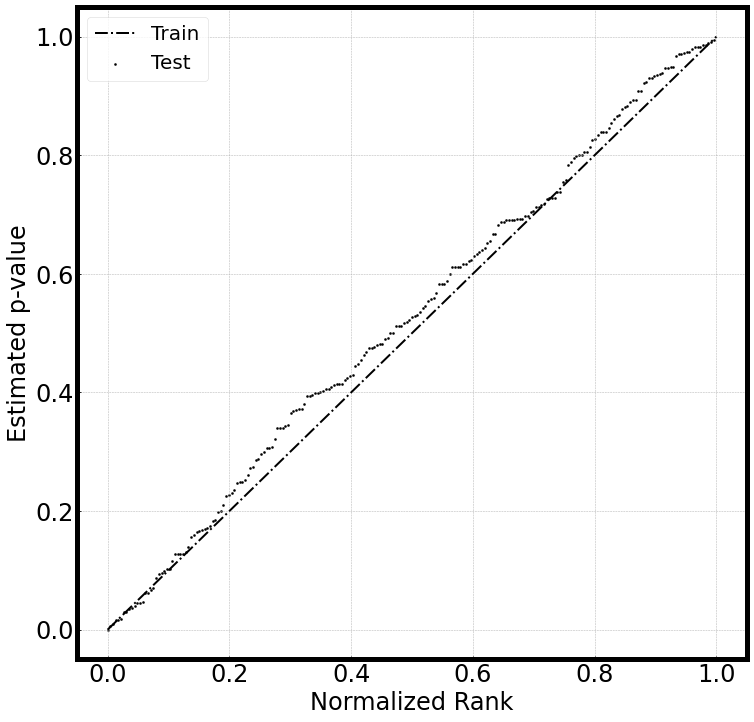

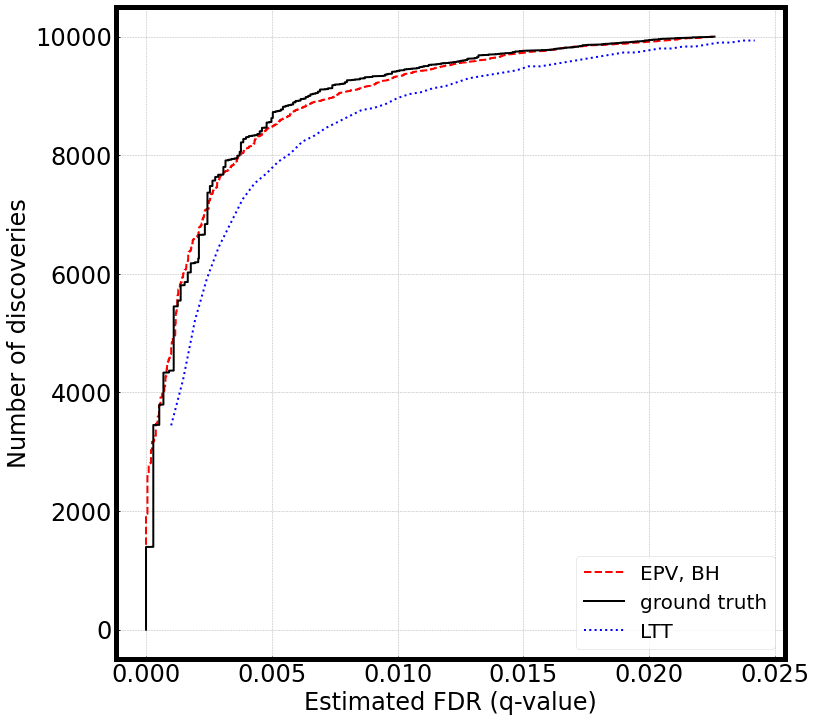

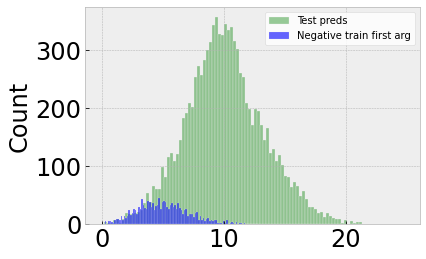

In [15]:
plt.rcParams['axes.labelsize'] = 24
plt.rcParams['axes.titlesize'] = 24
plt.rcParams['xtick.labelsize'] = 24
plt.rcParams['ytick.labelsize'] = 24
plt.rcParams["legend.facecolor"] = 'white'
bh_multi_control_of_fdr(model, n_epochs, 1)
plt.show()

In [20]:
train_pred_scores = model(train_img).squeeze()
test_pred_scores  = model(test_img).squeeze()

train_pred_max, train_pred_argmax = torch.max(train_pred_scores, dim=-1)
test_pred_max, test_pred_argmax   = torch.max(test_pred_scores, dim=-1)

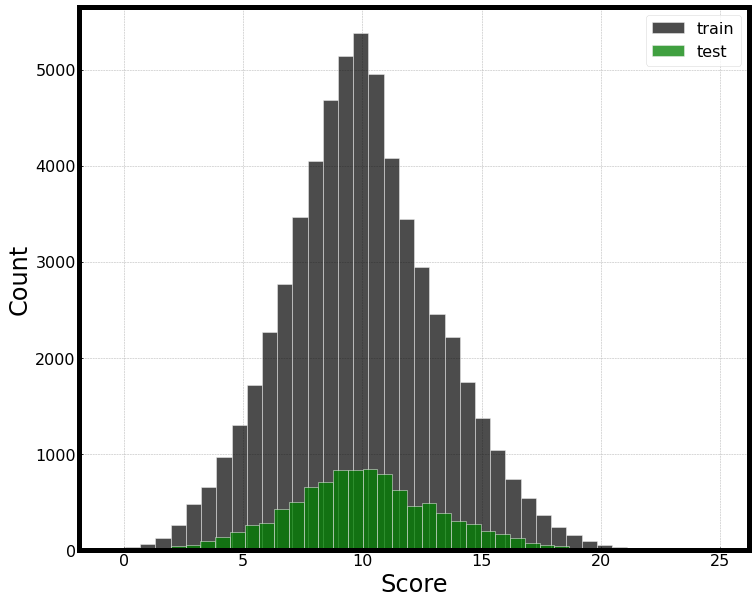

In [23]:
plt.rcParams['axes.labelsize'] = 24
plt.rcParams['axes.titlesize'] = 24
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams["legend.facecolor"] = 'white'
plt.rcParams['axes.axisbelow'] = True
fig, ax = plt.subplots(figsize=(12, 10))
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(5)
    ax.spines[axis].set_color("black")
ax.set(xlabel='Score', ylabel='Count', facecolor='white')
sns.histplot(train_pred_max.detach().numpy(), color='black', label='train', bins=40, alpha=0.7)
sns.histplot(test_pred_max.detach().numpy(), color='green', label='test', bins=40)
#sns.histplot(test_score_neg_shift_upd.detach().numpy(), color='red', stat='density', label='negative test updated')
#sns.histplot(test_score_neg_shift.detach().numpy(), color='red', stat='density')
#ax.axvline(x=test_pred_scores_shift_upd[1027].detach().numpy(), color='orange', label='f(Xi)', lw=7)
ax.legend(prop={'size': 16})
plt.show()

In [ ]:
def get_multi_scores(model, n_epochs, verbosity):   
    train_pred_max, train_pred_argmax = torch.max(train_pred_scores, dim=-1)
    test_pred_max, test_pred_argmax   = torch.max(test_pred_scores, dim=-1)
    
    
    bin_train_label = (train_label == train_pred_argmax).data.cpu().numpy().astype(int)
    bin_test_label  = (test_label == test_pred_argmax).data.cpu().numpy().astype(int)
    train_score_neg = train_pred_max[bin_train_label == 0].data.cpu().numpy()
    test_score_neg = test_pred_max[bin_test_label == 0]

    (1-torch.mean((torch.argmax(test_pred_scores, dim=-1) == test_label).float())).item()

    return 

In [ ]:

    '''
    bin_test_label = (test_label == target_label).data.cpu().numpy().astype(int)
    bin_train_label = (train_label == target_label).data.cpu().numpy().astype(int)
    bin_test_predicted_arg = (test_preds_argmax == target_label).data.cpu().numpy().astype(int)

    test_predicted_target = test_pred_scores[bin_test_label == 1][:, target_label]
    train_score_neg = train_pred_scores[bin_train_label == 0][:, target_label].data.cpu().numpy()

    if verbosity > 0: print('Plotting FDR control with BH')

    qvalues_labels  = calculate_qvalues_from_labels(test_predicted_target, bin_test_label)
    qvalues_bh  = calculate_qvalues_from_pvalues(train_score_neg, 
                                                 test_predicted_target.data.cpu().numpy(), 0.9)

    num_of_positives = sum(bin_test_label)

    ax[target_label // 5][target_label % 5].plot(qvalues_labels, np.arange(len(qvalues_labels)), 
                                                 color='blue', label='using true labels')
    ax[target_label // 5][target_label % 5].plot(qvalues_bh, np.arange(len(qvalues_bh)), 
                                                 color='red', label='using p-values')

    ax[target_label // 5][target_label % 5].legend()
    ax[target_label // 5][target_label % 5].set(xlabel='', ylabel='Number of accepted tests', 
                                                 title="%s, #pos: %d"%('Test', num_of_positives))
    break
    '''